# Data

In [1]:
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from xgboost.sklearn import XGBRegressor
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shap

import lime
import lime.lime_tabular

In [2]:
from model_function import Load_Model
import warnings
warnings.filterwarnings("ignore")


features = Load_Model("features")
X_train = Load_Model("X_train")
y_train = Load_Model("y_train")
xgb_model = Load_Model("xgb_model")
X_test = Load_Model("X_test")
y_test = Load_Model("y_test")
df = Load_Model("df")
df


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years,percent_houses_damaged
0,-0.704686,1.420347,-0.272376,-1.175524,-1.265043,-0.100972,0.691289,0.852915,1.094009,1.008363,-0.617499,-0.352036,0.935205,-0.731012,-1.510670,1.947325,-0.279989,-0.241398,0.0
1,-0.788156,1.673016,-0.270376,-1.133698,-1.255425,1.106914,0.878330,0.504172,0.893696,0.244915,-0.523135,2.853693,0.935205,-0.731012,-1.131296,1.565883,-0.278028,-0.241398,0.0
2,-0.654702,1.277761,-0.272098,-1.168104,-1.229554,-1.320165,1.784406,2.153799,2.099183,2.653361,-0.429186,3.181211,0.935205,-0.731012,-1.212591,1.647621,-0.276812,-0.241398,0.0
3,-0.700491,1.404514,-0.269193,-1.192053,-1.257415,-0.142657,0.468673,0.648387,0.594333,0.773553,-0.564862,2.440864,0.935205,-0.731012,-1.185493,1.620375,-0.265103,-0.241398,0.0
4,-0.743750,1.531266,-0.237499,-1.188679,-1.272174,-0.350679,0.845817,0.509406,0.791717,0.286700,-0.400399,4.370635,0.935205,-0.405585,-0.264156,0.503295,-0.197596,-0.241398,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49749,-1.064795,1.196675,-0.270872,-0.918833,-1.028225,-1.625712,0.232948,1.047870,0.320292,1.146974,-0.627544,-0.546194,0.935205,-0.684523,-1.510670,1.920079,-0.277650,0.534283,0.0
49750,-1.096719,1.324220,-0.213470,-0.932662,-1.067363,0.234747,-0.731858,-0.467369,-0.742849,-0.426405,-0.671409,1.987683,0.935205,-0.498564,-0.995806,1.293424,-0.241674,0.534283,0.0
49751,-1.132933,1.451765,-0.249755,-0.973477,-1.099370,1.060794,-0.733432,-0.545714,-0.691924,-0.451157,-0.694968,0.191214,0.935205,-0.684523,-1.456474,1.865587,-0.241895,0.534283,0.0
49752,-1.160069,1.579301,-0.271725,-0.677320,-0.994939,-0.409290,-0.717276,-0.989344,-0.597840,-0.822308,-0.701709,-0.347840,0.935205,-0.731012,-1.436766,1.873018,-0.273510,0.534283,0.0


In [3]:
import pandas as pd
X_train_df = pd.DataFrame(Load_Model("X_train"), columns = Load_Model("features"))


{'whiskers': [<matplotlib.lines.Line2D at 0x2060568e990>,
 'caps': [<matplotlib.lines.Line2D at 0x206056b0090>,
 'boxes': [<matplotlib.lines.Line2D at 0x2067c209ad0>,
 'medians': [<matplotlib.lines.Line2D at 0x206056b1450>,
 'fliers': [<matplotlib.lines.Line2D at 0x206056b1d90>,
 'means': []}

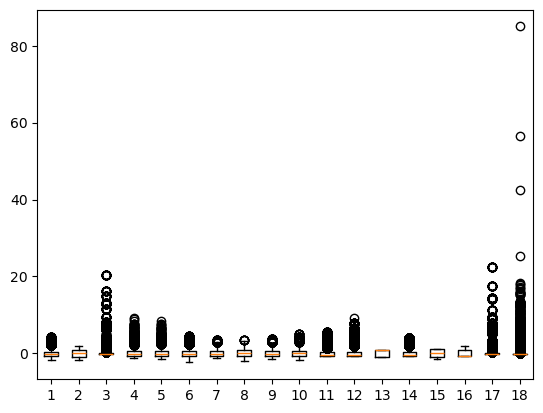

In [4]:
import matplotlib.pyplot as plt

X_train_df = pd.DataFrame(X_train, columns=features)
plt.boxplot(X_train_df, )
    #df, features)
# for feature in features:
#     plt.figure(figsize=(10, 6))
#     plt.title(feature)
#     plt.boxplot(df[feature])
#     plt.show()


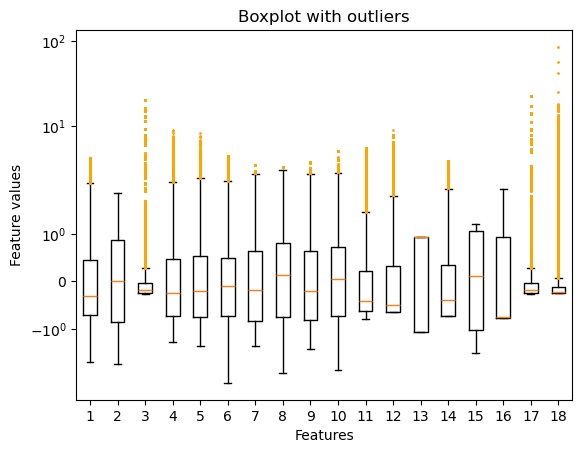

In [6]:
import matplotlib.pyplot as plt

# Assuming 'data' is your data
data = X_train_df

flierprops = dict(marker='o', markerfacecolor='orange', markersize=1,
                  linestyle='none', markeredgecolor='orange')

plt.boxplot(data, flierprops=flierprops)
plt.yscale('symlog')
plt.title('Boxplot with outliers')
plt.ylabel('Feature values')
plt.xlabel('Features')
plt.show()

In [7]:
X_train_df.describe()

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
count,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000,39803.000000
mean,-0.002143,0.004335,0.003170,-0.002330,-0.001688,0.002201,0.000055,-0.000370,0.000104,-0.000062,0.000388,-0.005000,-0.004567,0.002194,0.003215,-0.004519,0.003117,0.001704
std,0.998481,1.000240,1.013502,1.000059,1.000276,1.005465,0.999066,0.999702,0.998929,0.999761,0.997014,0.992042,1.000308,1.003765,1.000748,0.999116,1.009798,1.038877
min,-1.707177,-1.736926,-0.272381,-1.283463,-1.364270,-2.398227,-1.363106,-1.923889,-1.420829,-1.879706,-0.799384,-0.657215,-1.069284,-0.731012,-1.510670,-0.777261,-0.279989,-0.241398
25%,-0.705676,-0.861693,-0.255327,-0.722856,-0.753986,-0.725406,-0.832678,-0.763209,-0.827007,-0.741712,-0.620320,-0.657215,-1.069284,-0.731012,-1.022904,-0.777261,-0.258742,-0.241398
50%,-0.306720,0.014025,-0.194709,-0.247926,-0.209809,-0.100972,-0.193467,0.120476,-0.201337,0.052261,-0.413047,-0.494643,0.935205,-0.405585,0.115218,-0.750015,-0.191281,-0.234200
75%,0.449401,0.873717,-0.042749,0.468855,0.533233,0.487379,0.630685,0.797319,0.627169,0.709363,0.208688,0.321714,0.935205,0.338248,1.051336,0.939228,-0.044021,-0.119900
max,4.263524,1.854785,20.364842,9.156238,8.471007,4.542875,3.509511,3.354381,3.831545,5.098294,5.617673,9.089242,0.935205,3.917947,1.199144,1.947325,22.495408,85.026465


In [8]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train, feature_names=features, verbose=True, mode='regression', discretize_continuous=False)


# LIME for one instance

In [116]:
instance = X_test[0]
print(X_test[0])
explanation = explainer.explain_instance(instance, xgb_model.predict, num_features=len(features))
explanation.show_in_notebook(show_table = True, show_all = False)
explanation.as_list()

[-0.55396531  0.82459305 -0.10819771 -0.56364661 -0.17846537 -0.00861924
  0.31451644  1.83673062  0.37838282  2.19169017  0.18770967 -0.65721469
 -1.06928384 -0.08015816  0.81976967 -0.77726058 -0.1250148   1.34907533]
Intercept 0.4366415395010771
Prediction_local [0.01782129]
Right: -0.030170586


[('wind_speed', 0.4807545484644312),
 ('track_distance', -0.23657767011850328),
 ('rwi', -0.11962946560958065),
 ('rainfall_max_6h', 0.09030627826506471),
 ('percent_houses_damaged_5years', 0.060178694396165834),
 ('urban', -0.03309745276566216),
 ('rainfall_max_24h', 0.028420851271777955),
 ('mean_elev', -0.0251239255560271),
 ('coast_length', 0.02275614134995734),
 ('with_coast', -0.02274618476546138),
 ('mean_tri', -0.020314432119106732),
 ('mean_slope', 0.01746038770244154),
 ('total_houses', 0.010633481487613892),
 ('total_pop', -0.009162099301716483),
 ('std_tri', 0.005538410712759878),
 ('water', -0.0017739561641383005),
 ('rural', 0.001380653609068557),
 ('std_slope', -0.0013349129540937094)]

In [117]:
instance = X_test[1218]
print(X_test[1218])
explanation = explainer.explain_instance(instance, xgb_model.predict, num_features=len(features))
explanation.show_in_notebook(show_table = True, show_all = False)
explanation.as_list()

[ 2.98537239 -1.69864455 -0.20372202  2.31325849  2.1077929   0.17445714
 -0.50099026 -0.33909856 -0.4856899  -0.38112617 -0.64738462  2.67637011
  0.93520538 -0.26611652 -1.16578487  1.32810094 -0.21153429  0.12635347]
Intercept 0.19991467774413174
Prediction_local [6.44367922]
Right: 44.43


[('wind_speed', 1.0732837170744844),
 ('track_distance', -0.4079892279209553),
 ('rainfall_max_6h', 0.28057649629946757),
 ('coast_length', 0.27608655786703795),
 ('rainfall_max_24h', 0.251051538208077),
 ('percent_houses_damaged_5years', 0.13046226098804967),
 ('with_coast', 0.10405157828459467),
 ('water', 0.08488575908100904),
 ('rwi', -0.08348171690280533),
 ('mean_elev', -0.07660485203798333),
 ('urban', -0.07336388370040653),
 ('total_houses', -0.06203388129355726),
 ('std_tri', -0.05809461636560264),
 ('rural', -0.05314337195124838),
 ('mean_slope', -0.02973509104147502),
 ('mean_tri', -0.02512238188350915),
 ('std_slope', -0.018289608064549306),
 ('total_pop', -0.002136286717584489)]

In [29]:
exp_df = pd.DataFrame(explanation.as_list(),columns=['Feature','Contribution'])
# sort by absolute contribution
exp_df.sort_values(by='Contribution', key=abs, ascending=False, inplace=True)
exp_df



,Feature,Contribution
0,wind_speed,0.493601
1,track_distance,-0.171273
2,rainfall_max_6h,0.093447
3,percent_houses_damaged_5years,0.075650
4,rwi,-0.064749
5,rainfall_max_24h,0.048356
6,total_pop,-0.037425
7,water,-0.022916
8,coast_length,0.022024
9,mean_slope,-0.021106


In [30]:
pd.DataFrame(explanation.as_list())
print(explanation.score)

0.16468762115111835


# Global LIME

In [31]:
# Global lime values

explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train, feature_names=features, verbose=True, mode='regression', discretize_continuous=False)

# iterate through all instances of test set and save explanations for each feature in list
lime_dict = {}

for i in range(len(X_test)):
    instance = X_test[i]
    explanation = explainer.explain_instance(instance, xgb_model.predict, num_features=len(features))
    explist = dict(explanation.as_list())
    for feature in explist.keys():
        if feature not in lime_dict:
            lime_dict[feature] = []
        lime_dict[feature].append(explist[feature])

print(lime_dict)

avg_lime_dict = {}
for key in lime_dict.keys():
    avg_lime_dict[key] = np.mean(np.abs(lime_dict[key]))

avg_lime_dict

Intercept 0.4032634113531785
Prediction_local [-0.01945476]
Right: -0.030170586
Intercept 0.419349743343092
Prediction_local [1.92990005]
Right: 0.5290078
Intercept 0.4244704575187255
Prediction_local [0.48025946]
Right: 0.13395418
Intercept 0.4071785765345522
Prediction_local [0.55046688]
Right: 0.04915137
Intercept 0.45666453081099073
Prediction_local [0.73435436]
Right: 0.07312768
Intercept 0.4111116093778776
Prediction_local [1.48328671]
Right: 0.49015546
Intercept 0.40821466161986475
Prediction_local [0.73272064]
Right: 0.8183421
Intercept 0.44301159028861437
Prediction_local [2.15721211]
Right: 1.774486
Intercept 0.40391126726145643
Prediction_local [1.8710415]
Right: 2.781075
Intercept 0.4176252056863543
Prediction_local [1.07827531]
Right: 0.108476795
Intercept 0.4333227009248421
Prediction_local [1.84204062]
Right: 1.303105
Intercept 0.45339451091195176
Prediction_local [0.14129674]
Right: 0.013427935
Intercept 0.4410414857806212
Prediction_local [0.39318228]
Right: 0.03950135

{'wind_speed': 0.5200458514536888,
 'track_distance': 0.2199333486320809,
 'rwi': 0.11902795514813568,
 'percent_houses_damaged_5years': 0.06748309256305803,
 'rainfall_max_24h': 0.05186895856020081,
 'rainfall_max_6h': 0.08469608390301636,
 'total_pop': 0.023791710194276002,
 'mean_elev': 0.025674580959589986,
 'mean_slope': 0.01486787272282537,
 'total_houses': 0.015442532348631155,
 'coast_length': 0.029351923432014284,
 'urban': 0.040666413224856875,
 'std_slope': 0.015879194871037977,
 'rural': 0.015034514006719093,
 'with_coast': 0.014308405996306424,
 'std_tri': 0.014457985674065534,
 'water': 0.015096287041740798,
 'mean_tri': 0.014368391554189352}

In [32]:
X_test

array([[-0.55396531,  0.82459305, -0.10819771, ..., -0.77726058,
        -0.1250148 ,  1.34907533],
       [ 1.93999899, -1.19796279, -0.23027138, ..., -0.77726058,
        -0.25101185, -0.24139848],
       [-0.48934409,  0.16337167, -0.08105895, ..., -0.72276887,
        -0.07635452,  0.64785078],
       ...,
       [ 0.97624711, -1.38508212, -0.0545156 , ..., -0.61378545,
        -0.10002139, -0.24139848],
       [ 2.12888155, -0.82495336,  0.04818879, ..., -0.77726058,
         0.0878281 , -0.06208626],
       [-0.11859483,  1.37852714, -0.27194633, ...,  1.70211222,
        -0.27725201, -0.24139848]])

In [33]:
pd.DataFrame(lime_dict)

,wind_speed,track_distance,rwi,percent_houses_damaged_5years,rainfall_max_24h,rainfall_max_6h,total_pop,mean_elev,mean_slope,total_houses,coast_length,urban,std_slope,rural,with_coast,std_tri,water,mean_tri
0,0.457298,-0.206011,-0.091057,0.090555,0.075797,0.073065,-0.045675,-0.036761,-0.027358,-0.021486,0.019830,-0.016941,-0.015143,0.014013,0.011820,-0.006057,0.003796,-0.002341
1,0.749668,-0.271620,-0.153951,0.094317,0.097573,0.138586,-0.051206,-0.069415,-0.049864,-0.042614,0.044663,-0.061925,-0.000311,-0.010596,-0.042886,0.017204,-0.008927,-0.073045
2,0.479310,-0.240925,-0.183760,0.045357,0.016734,0.122204,-0.018185,-0.025598,0.010533,-0.020146,0.026395,-0.060351,-0.002545,0.009821,0.005878,0.011159,0.007284,-0.015222
3,0.482535,-0.222113,-0.113263,0.018310,0.029420,0.078458,0.012553,-0.035016,0.010418,-0.001225,0.031611,-0.061848,-0.027113,-0.009454,0.019709,-0.000716,0.016229,0.044207
4,0.559628,-0.273212,-0.146090,0.081183,0.030891,0.088789,-0.018440,-0.016269,0.003257,-0.038970,0.028752,-0.012914,0.005752,0.024944,-0.031077,-0.023968,0.029989,-0.033599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9946,0.428929,-0.187571,-0.136788,0.055898,0.058287,0.092908,-0.020465,-0.012679,0.018975,-0.015674,0.003627,-0.013712,-0.016929,0.015212,0.011531,-0.016979,0.005697,0.012170
9947,0.435727,-0.161721,-0.077025,0.056566,0.043910,0.059168,-0.017937,-0.009493,-0.008892,-0.032772,0.038756,-0.039225,-0.015024,-0.004601,-0.002530,0.010246,0.012873,0.003119
9948,0.561430,-0.288603,-0.105052,0.093553,0.058536,0.096531,-0.056560,-0.043749,-0.023679,-0.003967,0.017689,-0.028047,0.014922,-0.020055,-0.011240,-0.029363,0.022716,0.023353
9949,0.691808,-0.261750,-0.127740,0.052419,0.043333,0.120390,-0.024448,0.025232,0.043174,-0.024045,0.028919,-0.041962,-0.012304,0.015590,-0.036525,0.010062,0.016423,0.019842


In [34]:
# standard deviation for all features
std_lime_dict = {}
for key in lime_dict.keys():
    std_lime_dict[key] = np.std(lime_dict[key])
std_lime_dict

{'wind_speed': 0.12312165886129355,
 'track_distance': 0.04278460603829387,
 'rwi': 0.04380239164109599,
 'percent_houses_damaged_5years': 0.022542875825641278,
 'rainfall_max_24h': 0.021282936983123935,
 'rainfall_max_6h': 0.02581251683692553,
 'total_pop': 0.01890402464026943,
 'mean_elev': 0.019244803023152318,
 'mean_slope': 0.01880605492769249,
 'total_houses': 0.018257706788319783,
 'coast_length': 0.021870061921991365,
 'urban': 0.019966889073042258,
 'std_slope': 0.019161616053625454,
 'rural': 0.019362354090167063,
 'with_coast': 0.019079744959538306,
 'std_tri': 0.01973230819060998,
 'water': 0.019366344418300756,
 'mean_tri': 0.018641214805038445}

In [35]:
std_lime_dict2 = {}
for key in lime_dict.keys():
    std_lime_dict2[key] = np.std(np.abs(lime_dict[key]))
std_lime_dict2

{'wind_speed': 0.12312165886129324,
 'track_distance': 0.04278460097277906,
 'rwi': 0.04356682696499243,
 'percent_houses_damaged_5years': 0.022226807548492305,
 'rainfall_max_24h': 0.021083756162840916,
 'rainfall_max_6h': 0.02581251672126019,
 'total_pop': 0.01628934819405637,
 'mean_elev': 0.01700139974354961,
 'mean_slope': 0.012877784795198612,
 'total_houses': 0.012448838586118002,
 'coast_length': 0.02037172102214337,
 'urban': 0.019255050407277055,
 'std_slope': 0.013604559874347017,
 'rural': 0.013349964118460761,
 'with_coast': 0.012622453210059295,
 'std_tri': 0.013454912191888678,
 'water': 0.013418728192000176,
 'mean_tri': 0.01211340423535176}

In [37]:
dflime = pd.DataFrame(avg_lime_dict, index=["Value"]).transpose().sort_values(by="Value", ascending=False)
#
dflime["sd"] = pd.DataFrame(std_lime_dict, index=["Value"]).transpose()


dflime

,Value,sd
wind_speed,0.520046,0.123122
track_distance,0.219933,0.042785
rwi,0.119028,0.043802
rainfall_max_6h,0.084696,0.025813
percent_houses_damaged_5years,0.067483,0.022543
rainfall_max_24h,0.051869,0.021283
urban,0.040666,0.019967
coast_length,0.029352,0.021870
mean_elev,0.025675,0.019245
total_pop,0.023792,0.018904


<BarContainer object of 18 artists>

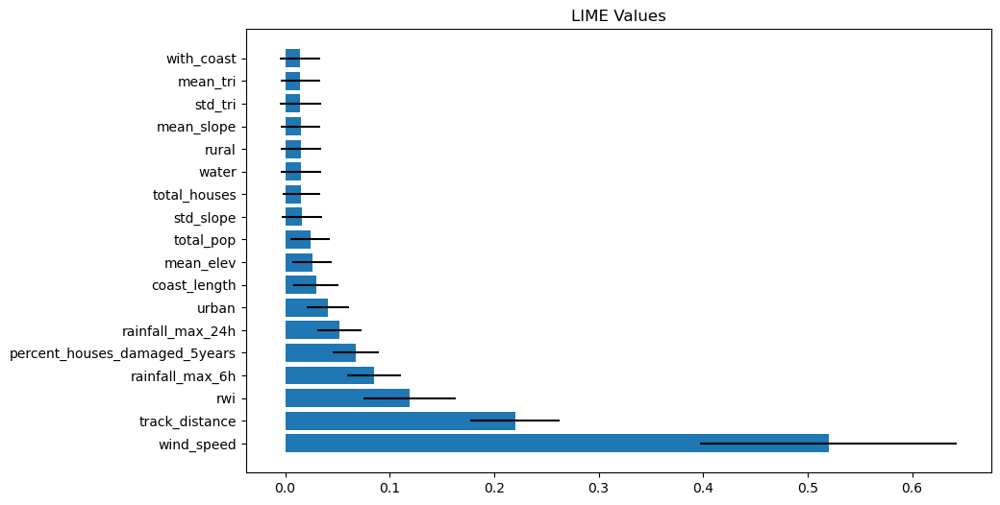

In [38]:
# plot lime values
plt.figure(figsize=(10, 6))
plt.title("LIME Values")
plt.barh(dflime.index, dflime["Value"], xerr=dflime["sd"])

In [39]:
lime_list = pd.DataFrame(avg_lime_dict, index=["Value"]).transpose().sort_values(by="Value", ascending=False).index.tolist()
lime_list

['wind_speed',
 'track_distance',
 'rwi',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'urban',
 'coast_length',
 'mean_elev',
 'total_pop',
 'std_slope',
 'total_houses',
 'water',
 'rural',
 'mean_slope',
 'std_tri',
 'mean_tri',
 'with_coast']

# SHAP

In [40]:
import shap
import pandas as pd
#from shap import markers

# background = maskers.Independent(X_train, 10) # data to train both explainers on

X_train4shapely = pd.DataFrame(data=X_train, columns=features)
explainer = shap.Explainer(xgb_model, X_train4shapely)
shap_values = explainer.shap_values(X_test)

In [41]:
shap_values.shape
X_test.shape

(9951, 18)

In [42]:
explainer_xgb = shap.TreeExplainer(xgb_model, X_train4shapely)
# shap_values_xgb = explainer_xgb(X_train4shapely)
#pred = xgb_model.predict(X_test, output_margin=True)

explainer2 = shap.TreeExplainer(xgb_model, X_train4shapely)
# explanation = explainer(X_test)

shap_values2 = explainer2(X_test)
# make sure the SHAP values add up to marginal predictions
# np.abs(shap_values.sum(axis=1) + explanation.base_values - pred).max()
shap_values2

.values =
array([[-7.25653216e-01, -1.46276993e-01, -1.24712820e-02, ...,
        -1.01196951e-02,  2.40514474e-04,  7.08663231e-02],
       [ 2.72652098e-01,  9.67665884e-02,  4.51241423e-02, ...,
        -4.27864008e-02,  1.39327080e-02, -1.99086760e-01],
       [-7.33135610e-01, -2.03956308e-01, -1.24712820e-02, ...,
        -5.67691270e-03,  3.26148713e-03,  9.23185935e-02],
       ...,
       [-3.09503078e-01,  3.44308855e-01, -2.37400903e-02, ...,
         1.46461565e-02,  7.29650606e-03, -2.54316806e-01],
       [ 2.88314808e+00, -1.44828711e-02, -3.90116570e-02, ...,
        -1.01196951e-02, -8.26495776e-02,  2.65874607e-01],
       [-6.12697707e-01, -9.79617385e-02,  1.69365181e-02, ...,
         3.61422879e-03,  7.84370390e-03, -8.23804158e-02]])

.base_values =
array([1.02127119, 1.02127119, 1.02127119, ..., 1.02127119, 1.02127119,
       1.02127119])

.data =
array([[-0.55396531,  0.82459305, -0.10819771, ..., -0.77726058,
        -0.1250148 ,  1.34907533],
       [ 1.93999

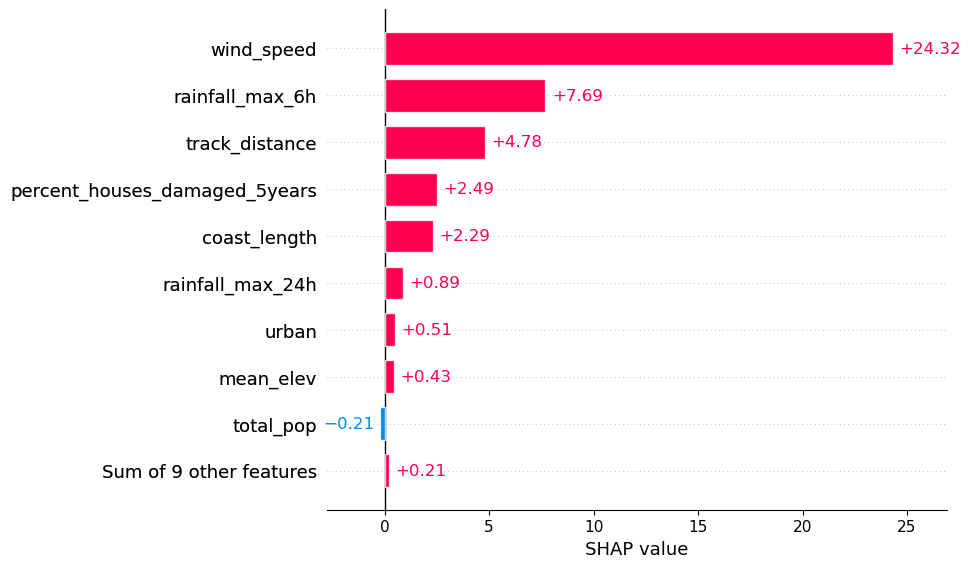

[44.43]


In [112]:
shap.plots.bar(shap_values2[1218])
print(xgb_model.predict(X_test[1218].reshape(1, -1)))

In [90]:
shap.initjs()

In [113]:
shap.plots.force(shap_values2[1218])

In [111]:
y_test = Load_Model("y_test")
# reset index
y_test = y_test.reset_index(drop=True)
# index with max value
y_test.idxmax()


1218

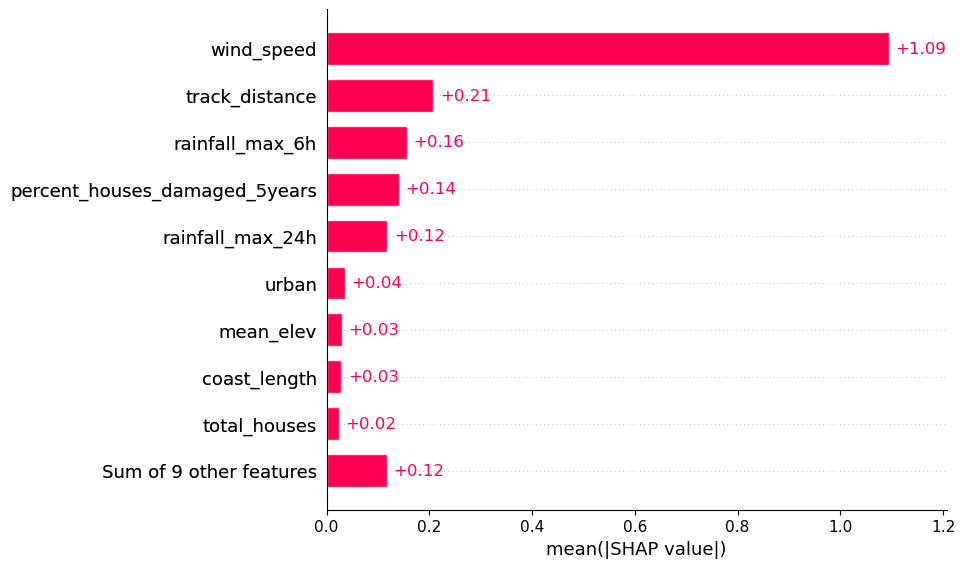

In [43]:
shap.plots.bar(shap_values2)

In [44]:
shap_df = pd.DataFrame(shap_values2.values, columns=shap_values2.feature_names)
shap_df

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
0,-0.725653,-0.146277,-0.012471,-0.152840,-0.087936,0.003015,0.002709,0.003839,0.001568,0.075032,-0.030463,-0.016201,0.000854,-0.026387,-0.001216,-0.010120,0.000241,0.070866
1,0.272652,0.096767,0.045124,-0.139432,-0.280184,0.011583,-0.077219,-0.097339,-0.070228,0.074608,-0.110912,-0.042088,0.000854,0.034238,0.017251,-0.042786,0.013933,-0.199087
2,-0.733136,-0.203956,-0.012471,-0.057981,0.008784,0.005211,0.002709,0.009427,0.001568,0.000000,0.007138,0.001001,0.000000,-0.004299,-0.001216,-0.005677,0.003261,0.092319
3,-0.608869,-0.119442,0.001792,-0.108421,-0.110512,0.004362,0.002709,0.003177,0.001568,0.000000,-0.003655,0.004133,0.000000,0.026654,-0.001216,0.011198,0.009349,-0.084947
4,-0.588096,0.056411,-0.019374,-0.110501,-0.101807,0.000549,0.002709,-0.013342,0.000896,0.000000,-0.010322,-0.008369,-0.000384,-0.067626,-0.001954,-0.008699,0.009798,-0.088033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9946,-0.671429,-0.172134,-0.012919,-0.067774,-0.016706,0.003864,-0.019856,-0.016321,-0.006676,0.000000,-0.016415,-0.020900,-0.000384,-0.006672,-0.001216,-0.007651,0.002188,0.092082
9947,-0.599028,-0.101760,-0.019374,-0.110901,-0.095358,-0.000222,0.002709,0.001769,0.000896,0.000000,-0.010420,0.001601,0.000000,-0.033613,-0.001954,-0.006725,0.000241,-0.083161
9948,-0.309503,0.344309,-0.023740,-0.130824,0.008806,0.014210,0.002709,-0.040358,0.000896,0.000000,0.020315,0.015343,0.000000,-0.026781,-0.001216,0.014646,0.007297,-0.254317
9949,2.883148,-0.014483,-0.039012,-0.145557,-0.334293,0.018201,0.062038,0.054037,0.000896,0.000000,0.004343,-0.019757,0.000000,-0.032178,-0.002691,-0.010120,-0.082650,0.265875


In [55]:
#shap_sd2 = shap_df.abs.std(axis=0).values
# std of absolut shap values 
shap_sd2 = shap_df.abs().std(axis=0).values

In [66]:
# average SHAP values for each feature
shap_avg = shap_values2.abs.mean(axis=0).values
shap_sd = shap_df.std(axis=0).values
shap_sd2 = shap_df.abs().std(axis=0).values

shapdf = pd.DataFrame(shap_avg.reshape(1, -1), columns=shap_values2.feature_names).transpose().sort_values(by=0, ascending=False)
# rename column 0 to Values
shapdf.rename(columns={0: "Value"}, inplace=True)
shapdf["sd"] = pd.DataFrame(shap_sd.reshape(1, -1), columns=shap_values2.feature_names).transpose()
shapdf["sd2"] = pd.DataFrame(shap_sd2.reshape(1, -1), columns=shap_values2.feature_names).transpose()
shapdf


,Value,sd,sd2
wind_speed,1.094608,3.340785,3.156450
track_distance,0.207404,0.439804,0.388361
rainfall_max_6h,0.155926,0.323310,0.286835
percent_houses_damaged_5years,0.140943,0.245044,0.211148
rainfall_max_24h,0.118454,0.300868,0.278480
urban,0.035135,0.071475,0.062654
mean_elev,0.029477,0.060910,0.054260
coast_length,0.028439,0.069601,0.063779
total_houses,0.023208,0.069361,0.065567
rwi,0.021398,0.186242,0.185013


In [67]:
shap_sd
# describe shap_df
shap_df.abs().describe()

#shap_df.describe()


,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
count,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9951.000000,9.951000e+03,9951.000000
mean,1.094608,0.207404,0.023208,0.155926,0.118454,0.021398,0.020770,0.021070,0.013761,0.005581,0.029477,0.028439,0.002027,0.035135,0.005753,0.012643,1.412065e-02,0.140943
std,3.156450,0.388361,0.065567,0.286835,0.278480,0.185013,0.060018,0.033263,0.070477,0.078712,0.054260,0.063779,0.014241,0.062654,0.019179,0.038127,3.584911e-02,0.211148
min,0.000573,0.000115,0.000101,0.000016,0.000028,0.000003,0.000138,0.000143,0.000022,0.000000,0.000021,0.000005,0.000000,0.000033,0.000631,0.000011,6.486569e-07,0.000495
25%,0.581014,0.099938,0.010421,0.099357,0.032276,0.003680,0.002709,0.008019,0.001568,0.000000,0.006906,0.008763,0.000000,0.023405,0.001216,0.004157,3.121276e-03,0.077316
50%,0.617490,0.123247,0.012447,0.109092,0.095992,0.004546,0.002709,0.009740,0.001568,0.000000,0.018778,0.017129,0.000000,0.026654,0.001216,0.008699,6.766611e-03,0.084947
75%,0.672580,0.165025,0.019720,0.119714,0.114605,0.019292,0.024073,0.016321,0.006244,0.000000,0.035320,0.025627,0.000854,0.040122,0.003161,0.010120,9.348564e-03,0.109814
max,56.029540,7.622431,2.163422,7.693517,5.494051,16.891679,1.607325,0.987557,2.177974,5.935948,2.400907,2.289593,0.165532,2.045577,0.624964,1.703786,1.052390e+00,3.596116


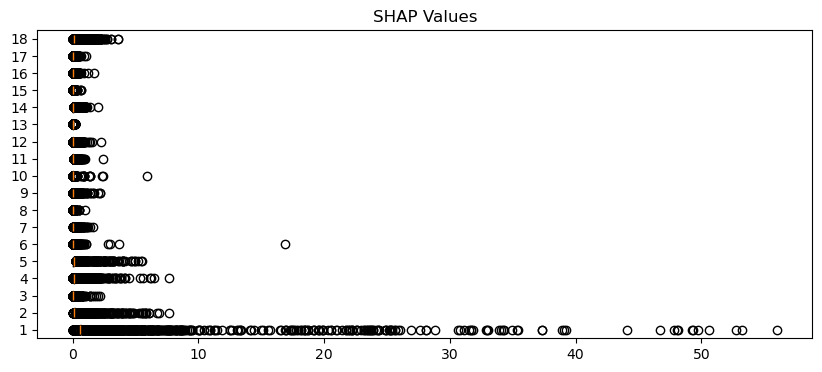

In [79]:
# boxplot of shap values
plt.figure(figsize=(10, 4))
plt.title("SHAP Values")
plt.boxplot(shap_df.abs(), vert=False)
plt.xscale('linear')


(0.0, 1.5)

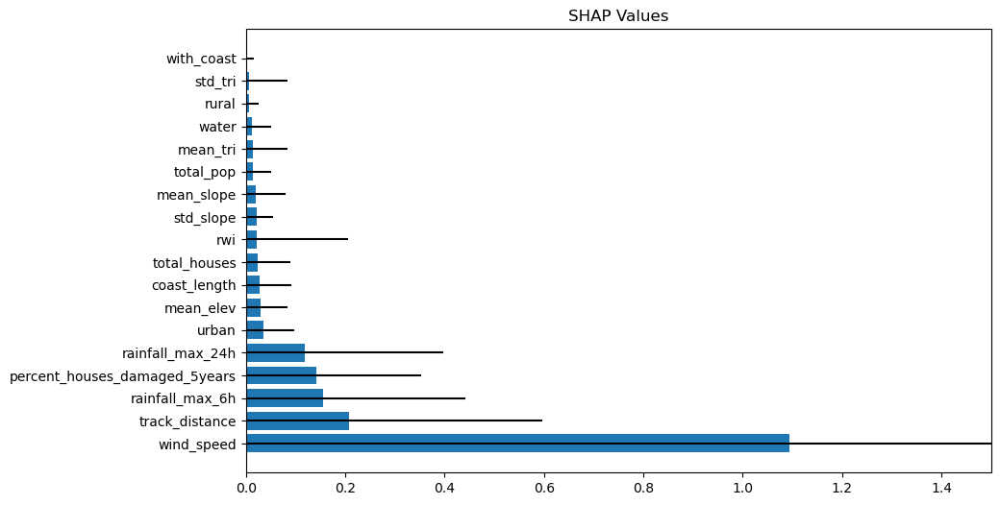

In [80]:
# plot shap values
plt.figure(figsize=(10, 6))
plt.title("SHAP Values")
plt.barh(shapdf.index, shapdf["Value"], xerr=shapdf["sd2"])
# set x axis to start with -0.5
plt.xlim(0, 1.5)

In [48]:
shap_list = pd.DataFrame(shap_avg.reshape(1, -1), columns=shap_values2.feature_names).transpose().sort_values(by=0, ascending=False)[0].keys()
shap_list

Index(['wind_speed', 'track_distance', 'rainfall_max_6h',
       'percent_houses_damaged_5years', 'rainfall_max_24h', 'urban',
       'mean_elev', 'coast_length', 'total_houses', 'rwi', 'std_slope',
       'mean_slope', 'total_pop', 'mean_tri', 'water', 'rural', 'std_tri',
       'with_coast'],
      dtype='object')

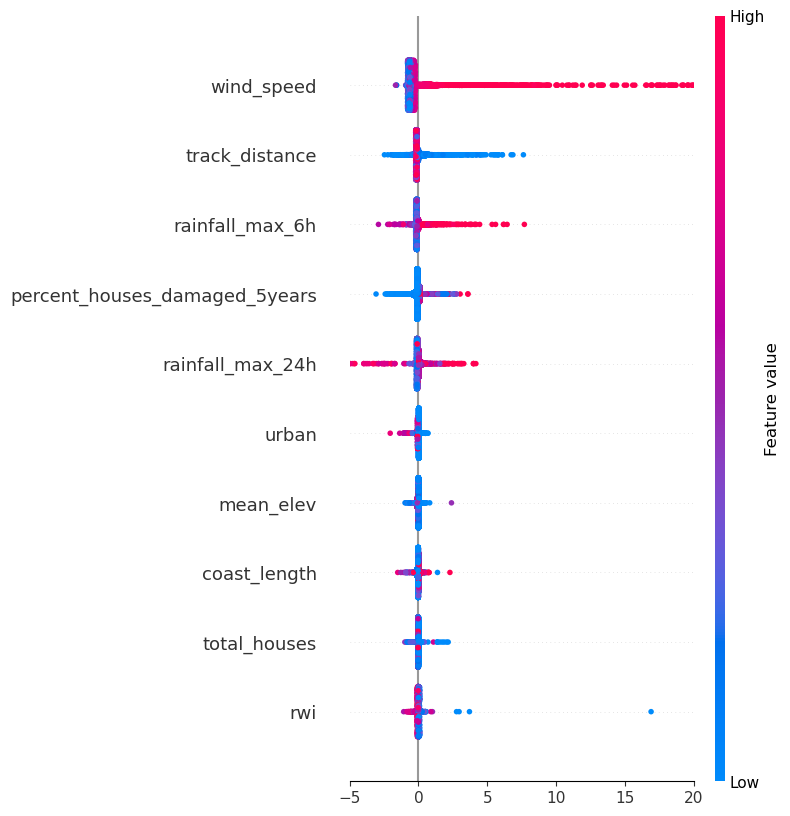

In [49]:
shap.summary_plot(shap_values2, max_display=10, plot_size=0.7, show=False)
ax = plt.gca()

ax.set_xlabel("")
# You can change the min and max value of xaxis by changing the arguments of:
ax.set_xlim(-5, 20)
plt.show()

# XGB Feature Importance

In [50]:
xgb_model.feature_importances_
# to pd-dataframe
xgb_df = pd.DataFrame(xgb_model.feature_importances_, index=features, columns=["Importance"]).sort_values(by="Importance", ascending=False)

xgb_df

,Importance
wind_speed,0.275721
std_tri,0.075317
track_distance,0.066827
with_coast,0.058273
rainfall_max_24h,0.056690
mean_tri,0.045909
percent_houses_damaged_5years,0.044407
rainfall_max_6h,0.042017
mean_slope,0.041864
std_slope,0.040832


In [51]:
# xgb_df to list of indices
xgb_list = xgb_df.index.tolist()
xgb_list

['wind_speed',
 'std_tri',
 'track_distance',
 'with_coast',
 'rainfall_max_24h',
 'mean_tri',
 'percent_houses_damaged_5years',
 'rainfall_max_6h',
 'mean_slope',
 'std_slope',
 'total_pop',
 'mean_elev',
 'water',
 'total_houses',
 'rural',
 'rwi',
 'coast_length',
 'urban']

# Two Stage Model

In [17]:
from model_function import Load_Model, TwoStageXGB

xgb2sg = TwoStageXGB()
xgb2sg.fit(X_train, y_train)
y_predxgb2 = xgb2sg.predict(X_test)
y_predxgb2

0       0.000000
1       0.772264
2       0.121737
3       0.036116
4       0.092302
          ...   
9946    0.069846
9947    0.000000
9948    0.838818
9949    2.310968
9950    0.022677
Name: predicted_percent_damage, Length: 9951, dtype: float32

In [19]:
y_predxgb2.shape

(9951,)

## SHAP

In [6]:
import shap
import pandas as pd

X_train4shapely = pd.DataFrame(data=X_train, columns=features)
explainer = shap.Explainer(xgb2sg.predict, X_train4shapely)
shap_values = explainer(X_test)

PermutationExplainer explainer: 9952it [1:09:15,  2.39it/s]                          


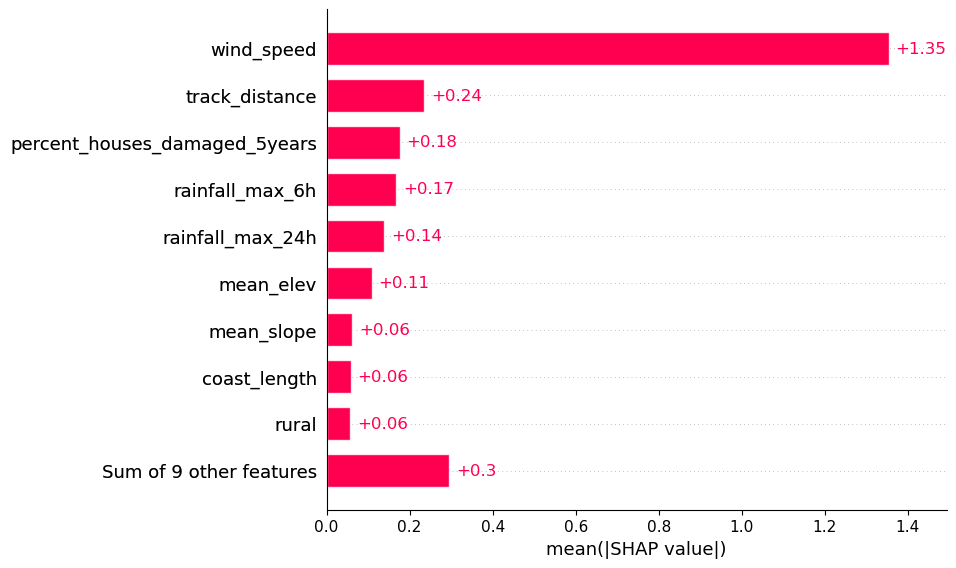

In [7]:
shap_values_xgb2 = shap_values
shap.plots.bar(shap_values)	


In [8]:
shap_df2st = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)
shap_df2st

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
0,-0.839904,-0.167502,-0.022590,-0.131461,-0.100147,0.001669,-0.021846,0.004080,-0.011187,0.055097,-0.060477,-0.041746,0.001111,-0.006548,0.002229,-0.002615,-0.005697,0.132177
1,0.642988,-0.005433,0.011845,-0.147605,-0.247525,0.022561,-0.157463,-0.030946,0.008133,-0.010778,-0.234677,-0.142505,0.007987,0.032692,0.129730,-0.034426,-0.016665,-0.271005
2,-0.890658,-0.240772,-0.026490,-0.083035,0.035838,0.009222,-0.023792,-0.017658,0.009733,0.037751,0.002924,0.031969,-0.001283,0.028361,0.016519,-0.010375,-0.020921,0.049047
3,-0.785974,-0.130225,0.034093,-0.041975,-0.090462,-0.003870,-0.020114,0.015872,0.015554,0.005887,-0.064394,0.005389,-0.000592,0.022678,-0.011550,0.020349,-0.019074,-0.130831
4,-0.711563,0.034585,-0.027380,-0.110614,-0.086162,0.019314,-0.018093,0.007962,0.002184,0.013231,-0.072392,-0.020622,0.001363,-0.055757,0.003545,-0.005187,0.011400,-0.108868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9946,-0.746088,-0.196937,-0.012957,-0.076536,-0.016612,-0.005272,-0.039038,0.007523,-0.012840,0.009614,-0.091799,-0.036698,0.000880,-0.008207,0.012638,-0.005624,-0.012796,0.085239
9947,-0.727384,-0.124030,-0.023750,-0.124931,-0.093802,0.008912,-0.036297,0.033290,0.003365,0.033708,-0.056186,0.010536,-0.000543,-0.014270,-0.001464,-0.002106,-0.013284,-0.087121
9948,-0.313277,0.362845,-0.019082,-0.145464,0.048496,-0.016350,-0.009400,0.024077,0.015652,0.040508,-0.077145,0.001346,-0.000395,-0.031067,-0.006269,0.017068,-0.002805,-0.265278
9949,1.898026,-0.195349,-0.145669,-0.210913,-0.259060,0.019632,0.019293,0.074361,0.124029,0.060231,-0.256310,0.026590,-0.000789,-0.105719,0.061361,-0.031775,-0.059873,0.077544


In [9]:
# average SHAP values for each feature
shap_avg = shap_values_xgb2.abs.mean(axis=0).values
shap_sd = shap_df2st.std(axis=0).values
shap_sd2 = shap_df2st.abs().std(axis=0).values

shapdf_summary2 = pd.DataFrame(shap_avg.reshape(1, -1), columns=shap_values_xgb2.feature_names).transpose().sort_values(by=0, ascending=False)
# rename column 0 to Values
shapdf_summary2.rename(columns={0: "Value"}, inplace=True)
shapdf_summary2["sd"] = pd.DataFrame(shap_sd.reshape(1, -1), columns=shap_values_xgb2.feature_names).transpose()
shapdf_summary2["sd2"] = pd.DataFrame(shap_sd2.reshape(1, -1), columns=shap_values_xgb2.feature_names).transpose()
shapdf_summary2

,Value,sd,sd2
wind_speed,1.354167,3.701712,3.445121
track_distance,0.235099,0.456876,0.393383
percent_houses_damaged_5years,0.176224,0.329119,0.290386
rainfall_max_6h,0.168209,0.419613,0.385132
rainfall_max_24h,0.138611,0.365024,0.338074
mean_elev,0.108894,0.238776,0.219212
mean_slope,0.061763,0.147587,0.138839
coast_length,0.058318,0.117630,0.102186
rural,0.057343,0.172928,0.163459
total_houses,0.048653,0.123421,0.113791


In [10]:
shap_list_xgb2 = pd.DataFrame(shap_avg.reshape(1, -1), columns=shap_values_xgb2.feature_names).transpose().sort_values(by=0, ascending=False)[0].keys()
shap_list_xgb2

Index(['wind_speed', 'track_distance', 'percent_houses_damaged_5years',
       'rainfall_max_6h', 'rainfall_max_24h', 'mean_elev', 'mean_slope',
       'coast_length', 'rural', 'total_houses', 'std_tri', 'urban',
       'std_slope', 'mean_tri', 'rwi', 'total_pop', 'water', 'with_coast'],
      dtype='object')

## LIME

In [81]:
from model_function import Load_Model
from imblearn.under_sampling import RandomUnderSampler
from xgboost.sklearn import XGBRegressor
from xgboost import XGBClassifier

class TwoStageXGB:
    def __init__(self, seed = None):
        self.seed = seed

    def fit(self, X_train, y_train):
        from model_function import Load_Model

        # model 1: full xgb model ########################################################
        self.xgb = Load_Model("xgb_model")
        self.features = Load_Model("features")
        # model 2: classifier model ######################################################
        thres = 10.0

        y_train_bool = y_train >= thres
        y_train_bin = (y_train_bool) * 1

        # Define undersampling strategy
        under = RandomUnderSampler(sampling_strategy=0.1)
        # Fit and apply the transform
        X_train_us, y_train_us = under.fit_resample(X_train, y_train_bin)

        # Use XGBClassifier as a Machine Learning model to fit the data
        xgb_model = XGBClassifier(eval_metric=["error", "logloss"])

        eval_set = [(X_train, y_train_bin)]
        self.xgb_model = xgb_model.fit(
                            X_train_us,
                            y_train_us,
                            eval_set=eval_set,
                            verbose=False,
                            )

        # model 3:highest damage xgb model ##############################################
        
        y_pred_train = self.xgb_model.predict(X_train)
        reduced_df = pd.DataFrame(X_train.copy(), columns=self.features)

        reduced_df["percent_houses_damaged"] = y_train.values
        reduced_df["predicted_value"] = y_pred_train

        fliterd_df = reduced_df[reduced_df.predicted_value == 1]

        # Split X and y from dataframe features
        X_r = fliterd_df[self.features]
        y_r = fliterd_df["percent_houses_damaged"]
        
        xgbR = XGBRegressor(
                        base_score=0.5,
                        booster="gbtree",
                        colsample_bylevel=0.8,
                        colsample_bynode=0.8,
                        colsample_bytree=0.8,
                        gamma=3,
                        eta=0.01,
                        importance_type="gain",
                        learning_rate=0.1,
                        max_delta_step=0,
                        max_depth=4,
                        min_child_weight=1,
                        missing=1,
                        n_estimators=100,
                        early_stopping_rounds=10,
                        n_jobs=1,
                        nthread=None,
                        objective="reg:squarederror",
                        reg_alpha=0,
                        reg_lambda=1,
                        scale_pos_weight=1,
                        seed=None,
                        silent=None,
                        subsample=0.8,
                        verbosity=0,
                        eval_metric=["rmse", "logloss"],
                        random_state=0,
                        )

        eval_set = [(X_r, y_r)]
        self.xgbR_model = xgbR.fit(X_r, y_r, eval_set=eval_set, verbose=False)

    def predict(self, X_test):
        if X_test.shape == (18,) or X_test.shape == (1, 18):
            if self.xgb_model.predict(X_test) == 1:
                return self.xgbR_model.predict(X_test)
            else:
                return self.xgb.predict(X_test)
            
        # Make predictions ########################################################################################

        reduced_test_df = pd.DataFrame(X_test.copy(), columns=self.features)
        reduced_test_df["predicted_value"] = self.xgb_model.predict(X_test)

        # high damaged prediction (df1) / not highly damaged prediction (df2)
        fliterd_test_df1 = reduced_test_df[reduced_test_df.predicted_value == 1]
        fliterd_test_df0 = reduced_test_df[reduced_test_df.predicted_value == 0]

        # Use X0 and X1 for the M1 and MR models' predictions
        X1 = fliterd_test_df1[self.features]
        X0 = fliterd_test_df0[self.features]

        # For the output equal to 1 apply MR to evaluate the performance
        y1_pred = self.xgbR_model.predict(X1) # reduced xgb model for pred = 1
        y1_pred = y1_pred.clip(0, 100) # 
        fliterd_test_df1["predicted_percent_damage"] = y1_pred


        # For the output equal to 0 apply M1 to evaluate the performance
        y0_pred = self.xgb.predict(X0) # full xgb model for pred = 0
        y0_pred = y0_pred.clip(0, 100)
        fliterd_test_df0["predicted_percent_damage"] = y0_pred

        # Join two dataframes together
        join_test_dfs = pd.concat([fliterd_test_df0, fliterd_test_df1])
        join_test_dfs = join_test_dfs.sort_index()

        return join_test_dfs["predicted_percent_damage"].values
    


In [82]:
xgb2sg = TwoStageXGB()
xgb2sg.fit(X_train, y_train)
y_predxgb2 = xgb2sg.predict(X_test)
y_predxgb2

array([0.        , 0.7722644 , 0.12173709, ..., 0.8388178 , 2.3109682 ,
       0.02267693], dtype=float32)

In [83]:
y_predxgb2.shape

(9951,)

In [84]:
def custom_regressor(x_test):
    x_test = np.array(x_test).reshape(1, -1)
    predictions = xgb2sg.predict(x_test)
    return predictions#np.array(predictions).reshape(1, -1)

In [85]:
X_test[2].shape == (18,)
i = X_test[2].reshape(1, -1)
i.shape
xgb2sg.predict(i)

# test if array is one dimensional


array([0.12173709], dtype=float32)

In [88]:
# Global lime values

explainer_lime = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_train), feature_names=features, verbose=True, mode='regression', discretize_continuous=False)

# iterate through all instances of test set and save explanations for each feature in list
lime_dict2 = {}
X_test = np.array(X_test)

for i in range(len(X_test)):
    instance = X_test[i]
    explanation = explainer_lime.explain_instance(instance, xgb2sg.predict, num_features=len(features))
    explist = dict(explanation.as_list())
    for feature in explist.keys():
        if feature not in lime_dict2:
            lime_dict2[feature] = []
        lime_dict2[feature].append(explist[feature])

print(lime_dict2)

avg_lime_dict2 = {}
for key in lime_dict2.keys():
    avg_lime_dict2[key] = np.mean(np.abs(lime_dict2[key]))

avg_lime_dict2

Intercept 0.5085383600203119
Prediction_local [-0.00201266]
Right: 0.0
Intercept 0.4661845756867594
Prediction_local [2.65287448]
Right: 0.7722644
Intercept 0.445512235535466
Prediction_local [0.6296479]
Right: 0.12173709
Intercept 0.48585258435837175
Prediction_local [0.6660867]
Right: 0.036116082
Intercept 0.500288882402969
Prediction_local [0.83930328]
Right: 0.092302345
Intercept 0.468363925287201
Prediction_local [1.97951691]
Right: 0.41481566
Intercept 0.48795471153994613
Prediction_local [0.82114419]
Right: 0.7462493
Intercept 0.4632171388448039
Prediction_local [2.47892609]
Right: 1.7057182
Intercept 0.4574422355296334
Prediction_local [2.53323692]
Right: 2.8154812
Intercept 0.47893322664625826
Prediction_local [1.26918322]
Right: 0.09297933
Intercept 0.4845090216175676
Prediction_local [2.35835789]
Right: 1.3227004
Intercept 0.5107032515361623
Prediction_local [0.03705473]
Right: 0.016751148
Intercept 0.46956270339203254
Prediction_local [0.59713769]
Right: 0.01746045
Intercep

{'wind_speed': 0.6181650627772436,
 'track_distance': 0.2897108980310704,
 'rwi': 0.18022169261459717,
 'rainfall_max_6h': 0.1006762833329037,
 'percent_houses_damaged_5years': 0.09059619734304118,
 'urban': 0.035839299542348366,
 'rainfall_max_24h': 0.05945066648087053,
 'total_pop': 0.042757368302240695,
 'coast_length': 0.04141773070492841,
 'with_coast': 0.01921964018596076,
 'total_houses': 0.025385735344471107,
 'rural': 0.031922257332375914,
 'water': 0.019679924852133074,
 'mean_elev': 0.022397005966553734,
 'mean_tri': 0.01982069016922081,
 'mean_slope': 0.024058336741284114,
 'std_tri': 0.019887850539840032,
 'std_slope': 0.019240583671817996}

In [90]:
dflime2 = pd.DataFrame(avg_lime_dict2, index=["Value"]).transpose().sort_values(by="Value", ascending=False)
dflime2

,Value
wind_speed,0.618165
track_distance,0.289711
rwi,0.180222
rainfall_max_6h,0.100676
percent_houses_damaged_5years,0.090596
rainfall_max_24h,0.059451
total_pop,0.042757
coast_length,0.041418
urban,0.035839
rural,0.031922


In [92]:
lime_list_xgb2 = pd.DataFrame(avg_lime_dict2, index=["Value"]).transpose().sort_values(by="Value", ascending=False).index.tolist()
lime_list_xgb2

['wind_speed',
 'track_distance',
 'rwi',
 'rainfall_max_6h',
 'percent_houses_damaged_5years',
 'rainfall_max_24h',
 'total_pop',
 'coast_length',
 'urban',
 'rural',
 'total_houses',
 'mean_slope',
 'mean_elev',
 'std_tri',
 'mean_tri',
 'water',
 'std_slope',
 'with_coast']